In [1]:
import os

In [2]:
path = 'data/AllTranscriptFlatOrtho'

#Create dict
names_dict = {}
i = 1
for filename in os.listdir(path):
    if ('DS_Store' not in filename): 
        names_dict['Audio'+str(i)] = filename
        i = i + 1

FileNotFoundError: [Errno 2] No such file or directory: 'data/AllTranscriptFlatOrtho'

In [ ]:
# path1 = 'data/AllTranscriptFlatOrtho/F_0101_10y4m_1.orth'

file3 = open ('data/Processed/Dictionary.txt','w')
for newName,origName in names_dict.items():
    file3.write(newName + " " + origName)
    file3.write("\n")

file3.close()


In [ ]:
#Writing ortho script to .txt file 

for newName,origName in names_dict.items():
    #new file with newName
    file = open('data/Processed/'+newName + '.txt','w')
    #script file
    file2 = open('data/AllTranscriptFlatOrtho/'+origName,'rb')
    #write the script to the new file
    script = file2.read()
    file.write(script.decode("utf-8", "ignore") )
    #close 
    file2.close()
    file.close()

In [1]:
from pylab import *
from scipy.io import wavfile
import matplotlib.pyplot as plt
import numpy as np
import librosa
import IPython.display as ipd

%matplotlib inline

In [2]:
sampFreq, snd = wavfile.read('Test.wav') #snd/sampFreq = duration of sound 
#We can convert our sound array to floating point values ranging from -1 to 1 as follows
snd = snd / (2.**15)
n = len(snd)
half_n = n//2
#Work with half of the time
snd = snd[:half_n]

In [6]:
s1 = snd[:5292]
#The human hearing bandwidth is 20Hz-20kHz, the audio sampled can be at the rate above 40kHz.(Usually 44.1KHz is preferred)
sampFreq = 44110

In [13]:
#Plot the tone
def plot_Tone (soundArray):
    length = len(soundArray)
    timeArray = arange(0, length, 1)
    sampFreq = 44110
    timeArray = timeArray / sampFreq
    timeArray = timeArray * 1000  #scale to milliseconds
    fig = plt.figure(figsize=(20, 5))
    plt.plot(timeArray, soundArray, color='k')
    ylabel('Amplitude')
    xlabel('Time (ms)')

In [8]:
#time = arange(0, 3000000, 1)
#plot_Tone(time,snd[:3000000])
2526720/sampFreq

57.28224892314668

In [9]:
ipd.Audio('Test.wav')

In [3]:
ipd.Audio(snd[:500000], rate=44110) # load a NumPy array
time = arange(0, 500000, 1)
plot_Tone(time,snd[:500000])
ipd.Audio(snd[:600000], rate=44110)
#First umm 0-100000
ipd.Audio(snd[:100000], rate=44110) # load a NumPy array
time = arange(0, 100000, 1)
plot_Tone(time,snd[:100000])
#Second umm 400000-470000
ipd.Audio(snd[380000:470000], rate=44110)
time = arange(0, 470000-380000, 1)
plot_Tone(time,snd[380000:470000])

In [4]:
librosa.output.write_wav('Cut1.wav', snd[:600000], 44110)

In [204]:
sampFreq, snd2 = wavfile.read('Cut1.wav')
ipd.Audio(snd2[:600000], rate=44110)

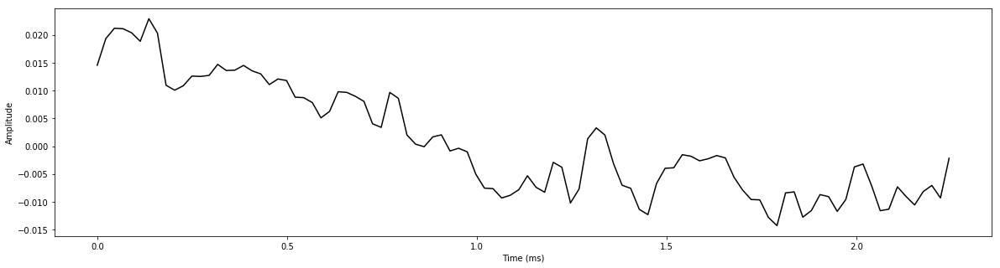

In [109]:
ipd.Audio(snd2[:100000], rate=44110)
plot_Tone(snd2[:100])

In [105]:
snd_new = [x for x in snd2[:100000] if (abs(x-0.0) > 0.016)]

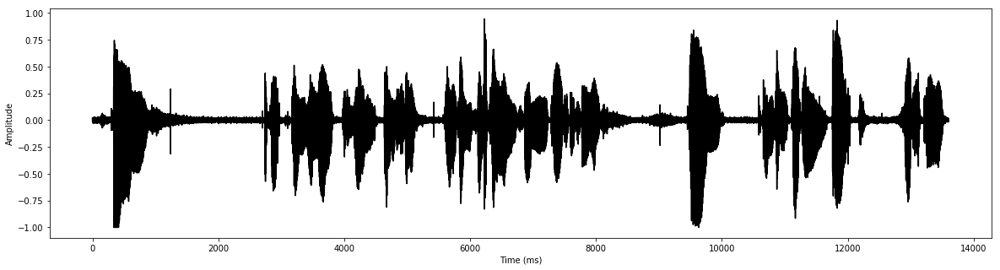

In [150]:
plot_Tone(snd2)

In [107]:
ipd.Audio(snd_new, rate=44110)

In [62]:
snd2[15000:200000]

array([ 0.07006836,  0.03790283, -0.0211792 , ..., -0.01300049,
       -0.00601196, -0.0090332 ])

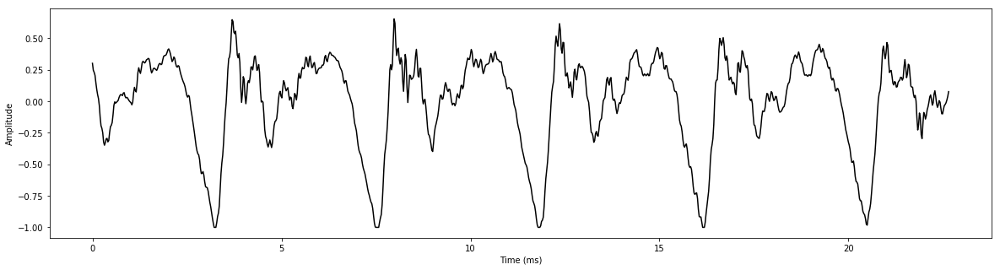

In [68]:
plot_Tone(snd2[17000:18000])

0.10833740234375 -0.094970703125


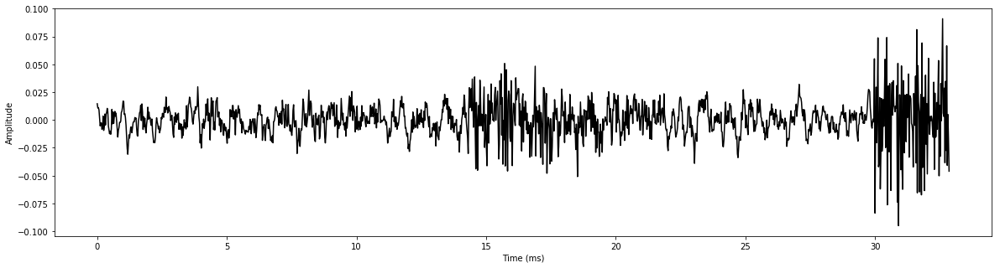

In [139]:
plot_Tone(snd2[:14500:10])
print(max(snd2[:14500]), min(snd2[:14500]))

0.7447509765625 -1.0


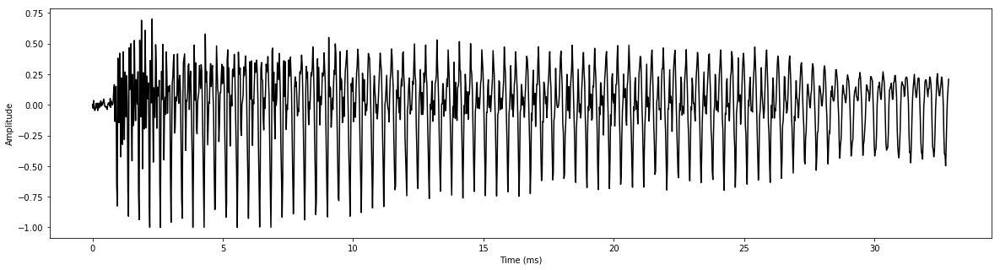

In [138]:
plot_Tone(snd2[14500:29000:10])
print(max(snd2[14500:29000]), min(snd2[14500:29000]))

In [166]:
from pydub import AudioSegment
from pydub.silence import split_on_silence

AudioSegment.converter = "/Users/ThyDo/Downloads/ffmpeg"
sound_file = AudioSegment.from_wav("Cut1.wav")
# sound_file  = sound_file [t1:t2]
# sound_file .export('newSong.wav', format="wav")

/Users/ThyDo/anaconda2/envs/py35/lib/python3.5/site-packages/pydub/utils.py:193: RuntimeWarning: Couldn't find ffprobe or avprobe - defaulting to ffprobe, but may not work
  warn("Couldn't find ffprobe or avprobe - defaulting to ffprobe, but may not work", RuntimeWarning)


FileNotFoundError: [Errno 2] No such file or directory: 'ffprobe'

In [157]:
print(len(sound_file.get_array_of_samples()))

NameError: name 'sound_file' is not defined

In [179]:
#audio_chunks = split_on_silence(snd2, min_silence_len=100,silence_thresh=-10)
audio_chunks = split_on_silence(snd2, min_silence_len=1000, silence_thresh=None, keep_silence=100)

TypeError: float() argument must be a string or a number, not 'NoneType'

In [176]:
from pydub.playback import play

In [177]:
for i, chunk in enumerate(audio_chunks):
    print (i,chunk.get_array_of_samples())
    #out_file = "chunk{0}.wav".format(i)
    #chunk.export(out_file, format="wav")

NameError: name 'audio_chunks' is not defined

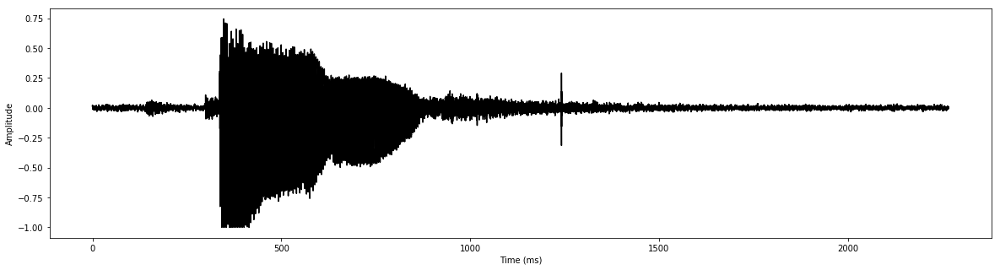

In [147]:
plot_Tone(snd2[:100000])

Text(0,0.5,'Power (dB)')

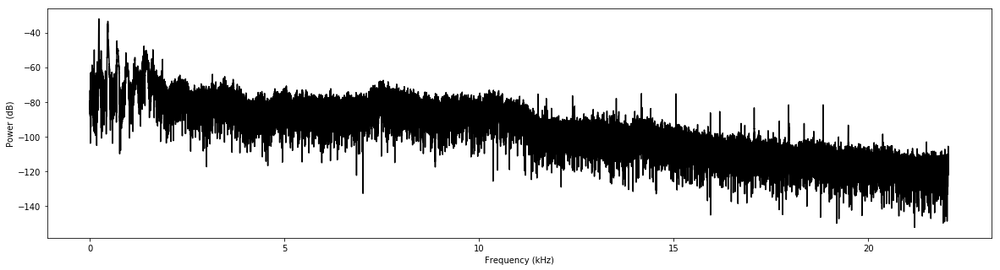

In [149]:
##FFT 
n = len(snd2[:100000]) 
p = fft(snd2[:100000]) # take the fourier transform 
nUniquePts = int(ceil((n+1)/2.0))
p = p[0:nUniquePts]
p = abs(p)

p = p / float(n) # scale by the number of points so that
                 # the magnitude does not depend on the length 
                 # of the signal or on its sampling frequency  
p = p**2  # square it to get the power 

# multiply by two (see technical document for details)
# odd nfft excludes Nyquist point
if n % 2 > 0: # we've got odd number of points fft
    p[1:len(p)] = p[1:len(p)] * 2
else:
    p[1:len(p) -1] = p[1:len(p) - 1] * 2 # we've got even number of points fft

freqArray = arange(0, nUniquePts, 1.0) * (sampFreq / n);

fig = plt.figure(figsize=(20, 5))
plt.plot(freqArray/1000, 10*log10(p), color='k')
xlabel('Frequency (kHz)')
ylabel('Power (dB)')

In [183]:
len(snd2)

600000

In [200]:
import plotly
plotly.tools.set_credentials_file(username='dpt9797', api_key='Za0LD8b6UTOSZFCfnCGN')

In [205]:
import matplotlib.pyplot as plt
import plotly.plotly as py
import numpy as np
# Learn about API authentication here: https://plot.ly/python/getting-started
# Find your api_key here: https://plot.ly/settings/api

Fs = sampFreq;  # sampling rate
#Ts = 1.0/Fs; # sampling interval
#t = np.arange(0,1,Ts) # time vector
#ff = 5;   # frequency of the signal
#y = np.sin(2*np.pi*ff*t)
y = snd2

n = len(y) # length of the signal
t = arange(0, n, 1)

k = np.arange(n)
T = n/Fs
frq = k/T # two sides frequency range
frq = frq[range(n//2)] # one side frequency range

Y = np.fft.fft(y)/n # fft computing and normalization
Y = Y[range(n//2)]

fig, ax = plt.subplots(2, 1)
ax[0].plot(t,y)
ax[0].set_xlabel('Time')
ax[0].set_ylabel('Amplitude')
ax[1].plot(frq,abs(Y),'r') # plotting the spectrum
ax[1].set_xlabel('Freq (Hz)')
ax[1].set_ylabel('|Y(freq)|')

plot_url = py.plot_mpl(fig, filename='mpl-basic-fft')

/Users/ThyDo/anaconda2/envs/py35/lib/python3.5/site-packages/plotly/plotly/plotly.py:230: UserWarning:

Woah there! Look at all those points! Due to browser limitations, the Plotly SVG drawing functions have a hard time graphing more than 500k data points for line charts, or 40k points for other types of charts. Here are some suggestions:
(1) Use the `plotly.graph_objs.Scattergl` trace object to generate a WebGl graph.
(2) Trying using the image API to return an image instead of a graph URL
(3) Use matplotlib
(4) See if you can create your visualization with fewer data points

If the visualization you're using aggregates points (e.g., box plot, histogram, etc.) you can disregard this warning.

/Users/ThyDo/anaconda2/envs/py35/lib/python3.5/site-packages/plotly/api/v1/clientresp.py:40: UserWarning:

Estimated Draw Time Too Long



High five! You successfully sent some data to your account on plotly. View your plot in your browser at https://plot.ly/~dpt9797/0 or inside your plot.ly account where it is named 'mpl-basic-fft'
